<a href="https://colab.research.google.com/github/rinogrego/Learning-VLM/blob/main/explorations/florence-2/florence2_base_VQA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install flash_attn timm einops
!pip install -q git+https://github.com/huggingface/transformers.git
!pip install -q -U accelerate datasets peft bitsandbytes
!pip install tqdm wandb
!pip install git+https://github.com/huggingface/trl.git

from google.colab import output
output.clear()
print("install packages success")

install packages success


In [ ]:
!nvcc --version
!nvidia-smi

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
Fri Jul  5 07:23:26 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   47C    P8               9W /  7

In [ ]:
import requests

from PIL import Image

In [ ]:
import torch
from datasets import load_dataset
from transformers import AutoModelForCausalLM, AutoProcessor, BitsAndBytesConfig
from transformers import get_scheduler

from torch.utils.data import DataLoader, Dataset
from tqdm import tqdm
import os

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

## Load Model

In [ ]:
model = AutoModelForCausalLM.from_pretrained("microsoft/Florence-2-base", trust_remote_code=True)
processor = AutoProcessor.from_pretrained("microsoft/Florence-2-base", trust_remote_code=True)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/2.43k [00:00<?, ?B/s]

configuration_florence2.py:   0%|          | 0.00/15.1k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-base:
- configuration_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


modeling_florence2.py:   0%|          | 0.00/127k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-base:
- modeling_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


pytorch_model.bin:   0%|          | 0.00/464M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

processing_florence2.py:   0%|          | 0.00/46.4k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-base:
- processing_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


tokenizer_config.json:   0%|          | 0.00/34.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.10M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

In [ ]:
model

Florence2ForConditionalGeneration(
  (vision_tower): DaViT(
    (convs): ModuleList(
      (0): ConvEmbed(
        (proj): Conv2d(3, 128, kernel_size=(7, 7), stride=(4, 4), padding=(3, 3))
        (norm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
      )
      (1): ConvEmbed(
        (proj): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (norm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
      )
      (2): ConvEmbed(
        (proj): Conv2d(256, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (norm): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
      )
      (3): ConvEmbed(
        (proj): Conv2d(512, 1024, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      )
    )
    (blocks): ModuleList(
      (0): MySequential(
        (0): MySequential(
          (spatial_block): SpatialBlock(
            (conv1): PreNorm(
              (fn): Depth

In [ ]:
processor

Florence2Processor:
- image_processor: CLIPImageProcessor {
  "auto_map": {
    "AutoProcessor": "microsoft/Florence-2-base--processing_florence2.Florence2Processor"
  },
  "crop_size": {
    "height": 768,
    "width": 768
  },
  "do_center_crop": false,
  "do_convert_rgb": null,
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.485,
    0.456,
    0.406
  ],
  "image_processor_type": "CLIPImageProcessor",
  "image_seq_length": 577,
  "image_std": [
    0.229,
    0.224,
    0.225
  ],
  "processor_class": "Florence2Processor",
  "resample": 3,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "height": 768,
    "width": 768
  }
}

- tokenizer: BartTokenizerFast(name_or_path='microsoft/Florence-2-base', vocab_size=50265, model_max_length=1024, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'bos_token': '<s>', 'eos_token': '</s>', 'unk_token': '<unk>', 'sep_token': '</s>', 'pad_token': '<pad>', 'cls_token': '

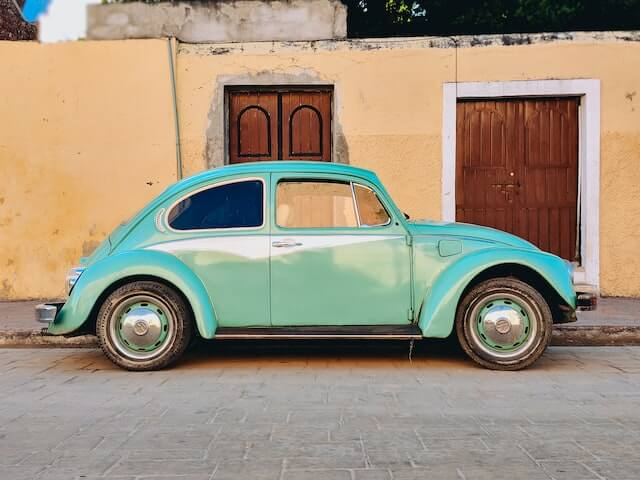

In [ ]:
prompt = "<OD>"

url = "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/transformers/tasks/car.jpg?download=true"
image = Image.open(requests.get(url, stream=True).raw)
image

In [ ]:
inputs = processor(text=prompt, images=image, return_tensors="pt")
inputs

{'input_ids': tensor([[    0,   574, 22486,     5,  8720,    19,  4120,   766,    11,     5,
          2274,     4,     2]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]]), 'pixel_values': tensor([[[[-1.1418, -0.7479, -0.9192,  ..., -1.9295, -1.9467, -1.9638],
          [-0.7650, -0.7137, -0.9192,  ..., -1.9295, -1.9467, -1.9638],
          [-0.2684, -0.7308, -0.9705,  ..., -1.9467, -1.9638, -1.9809],
          ...,
          [ 0.5707,  0.5707,  0.5707,  ...,  0.3481,  0.3481,  0.3652],
          [ 0.5707,  0.5707,  0.5707,  ...,  0.3823,  0.3823,  0.3652],
          [ 0.5707,  0.5707,  0.5707,  ...,  0.4166,  0.3994,  0.3823]],

         [[-1.3880, -0.9853, -1.1604,  ..., -1.6506, -1.6681, -1.6856],
          [-1.0028, -0.9503, -1.1604,  ..., -1.6506, -1.6681, -1.6856],
          [-0.4951, -0.9678, -1.2129,  ..., -1.6681, -1.6856, -1.7031],
          ...,
          [ 0.6078,  0.6078,  0.6078,  ...,  0.3978,  0.3978,  0.4153],
          [ 0.6078,  0.6078,  0.6078,

In [ ]:
print(inputs.keys())
print(inputs["input_ids"].shape)
print(inputs["attention_mask"].shape)
print(inputs["pixel_values"].shape)

dict_keys(['input_ids', 'attention_mask', 'pixel_values'])
torch.Size([1, 13])
torch.Size([1, 13])
torch.Size([1, 3, 768, 768])


In [ ]:
generated_ids = model.generate(
    input_ids=inputs["input_ids"],
    pixel_values=inputs["pixel_values"],
    max_new_tokens=1024,
    do_sample=False,
    num_beams=3,
)
generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]

In [ ]:
parsed_answer = processor.post_process_generation(generated_text, task="<OD>", image_size=(image.width, image.height))
print(parsed_answer)

{'<OD>': {'bboxes': [[34.23999786376953, 160.0800018310547, 597.4400024414062, 371.7599792480469], [272.32000732421875, 241.67999267578125, 303.67999267578125, 247.4399871826172], [454.0799865722656, 276.7200012207031, 553.9199829101562, 370.79998779296875], [96.31999969482422, 280.55999755859375, 198.0800018310547, 371.2799987792969]], 'labels': ['car', 'door handle', 'wheel', 'wheel']}}


array([[[ 61,  41,  40],
        [ 83,  63,  62],
        [ 63,  43,  42],
        ...,
        [ 11,  22,  18],
        [ 10,  21,  17],
        [  9,  20,  16]],

       [[106,  86,  85],
        [ 75,  55,  54],
        [ 69,  49,  48],
        ...,
        [ 10,  21,  17],
        [  9,  20,  16],
        [  8,  19,  15]],

       [[104,  84,  83],
        [ 43,  23,  22],
        [ 59,  39,  38],
        ...,
        [  9,  20,  16],
        [  8,  19,  15],
        [  7,  18,  14]],

       ...,

       [[156, 150, 150],
        [156, 150, 150],
        [156, 150, 150],
        ...,
        [147, 142, 139],
        [149, 144, 141],
        [150, 145, 142]],

       [[157, 151, 151],
        [157, 151, 151],
        [157, 151, 151],
        ...,
        [144, 139, 136],
        [144, 139, 136],
        [145, 140, 137]],

       [[157, 151, 151],
        [157, 151, 151],
        [157, 151, 151],
        ...,
        [149, 144, 141],
        [147, 142, 139],
        [146, 141, 138]]], dtype=uint8)
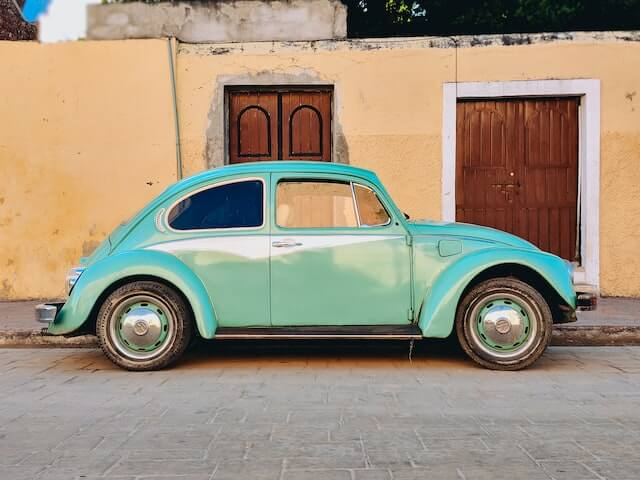

In [ ]:
np.asarray(image)

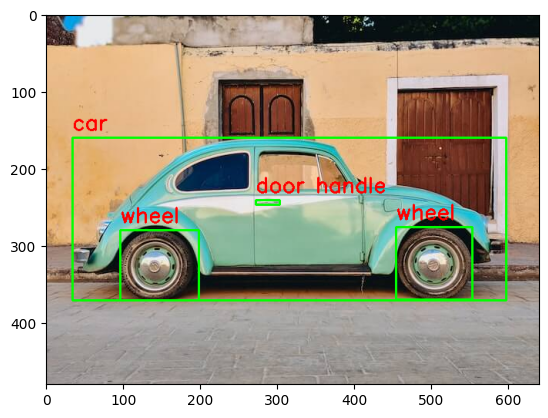

In [ ]:
draw_img = np.asarray(image)
for bbox, label in zip(parsed_answer["<OD>"]["bboxes"], parsed_answer["<OD>"]["labels"]):
    x2 = int(bbox[2])
    x1 = int(bbox[0])
    y2 = int(bbox[3])
    y1 = int(bbox[1])
    draw_img = cv2.rectangle(draw_img, (x1, y1), (x2, y2), (0, 255, 0), 2)
    cv2.putText(draw_img, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
plt.imshow(draw_img)

## Fine-Tuning: DocVQA 1200 examples

In [ ]:
# data = load_dataset("HuggingFaceM4/DocumentVQA")
data = load_dataset("nielsr/docvqa_1200_examples")

In [ ]:
data["train"]["query"][:50]

[{'de': 'Wie lautet das Datum, das in diesem Brief erwähnt wird?',
  'en': 'what is the date mentioned in this letter?',
  'es': '¿Cuál es la fecha mencionada en esta carta?',
  'fr': 'Quelle est la date mentionnée dans cette lettre?',
  'it': 'Qual è la data indicata in questa lettera?'},
 {'de': 'Wer ist in diesem Brief?',
  'en': 'Who is in  cc in this letter?',
  'es': '¿Quién está en cc en esta carta?',
  'fr': 'Qui est dans cette lettre?',
  'it': "Chi c'è in questa lettera?"},
 {'de': 'Was ist das Thema dieses Briefes?',
  'en': 'what is the subject of  this letter?',
  'es': '¿Cuál es el tema de esta carta?',
  'fr': 'Quel est le sujet de cette lettre?',
  'it': "Qual è l'oggetto di questa lettera?"},
 {'de': 'Wie ist die Zahl unten auf der Seite, in Fettdruck?',
  'en': 'What is the number at the bottom of the page, in bold?',
  'es': '¿Cuál es el número en la parte inferior de la página, en negrita?',
  'fr': 'Quel est le numéro au bas de la page, en caractères gras?',
  'it'

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = AutoModelForCausalLM.from_pretrained(
    "microsoft/Florence-2-base-ft",
    trust_remote_code=True,
    revision='refs/pr/6'
).to(device)
processor = AutoProcessor.from_pretrained(
    "microsoft/Florence-2-base-ft",
    trust_remote_code=True, revision='refs/pr/6'
)

In [ ]:
processor

Florence2Processor:
- image_processor: CLIPImageProcessor {
  "auto_map": {
    "AutoProcessor": "microsoft/Florence-2-base-ft--processing_florence2.Florence2Processor"
  },
  "crop_size": {
    "height": 768,
    "width": 768
  },
  "do_center_crop": false,
  "do_convert_rgb": null,
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.485,
    0.456,
    0.406
  ],
  "image_processor_type": "CLIPImageProcessor",
  "image_seq_length": 577,
  "image_std": [
    0.229,
    0.224,
    0.225
  ],
  "processor_class": "Florence2Processor",
  "resample": 3,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "height": 768,
    "width": 768
  }
}

- tokenizer: BartTokenizerFast(name_or_path='microsoft/Florence-2-base-ft', vocab_size=50265, model_max_length=1024, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'bos_token': '<s>', 'eos_token': '</s>', 'unk_token': '<unk>', 'sep_token': '</s>', 'pad_token': '<pad>', 'cls_tok

In [ ]:
model

Florence2ForConditionalGeneration(
  (vision_tower): DaViT(
    (convs): ModuleList(
      (0): ConvEmbed(
        (proj): Conv2d(3, 128, kernel_size=(7, 7), stride=(4, 4), padding=(3, 3))
        (norm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
      )
      (1): ConvEmbed(
        (proj): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (norm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
      )
      (2): ConvEmbed(
        (proj): Conv2d(256, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (norm): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
      )
      (3): ConvEmbed(
        (proj): Conv2d(512, 1024, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      )
    )
    (blocks): ModuleList(
      (0): MySequential(
        (0): MySequential(
          (spatial_block): SpatialBlock(
            (conv1): PreNorm(
              (fn): Depth

In [ ]:
def detailed_parameter_count(model, _print=False):
    total_params = 0
    total_trainable_params = 0
    for name, param in model.named_parameters():
        param_count = param.numel()
        total_params += param_count
        if param.requires_grad:
            if _print:
                print(f"{name}: {param_count} parameters")
            total_trainable_params += param_count
    return total_params, total_trainable_params

In [ ]:
total_params, total_trainable_params = detailed_parameter_count(model)
print(f"Total number of parameters           : {total_params}")
print(f"Total number of trainable parameters : {total_trainable_params}")

Total number of parameters           : 270803968
Total number of trainable parameters : 270803968


In [ ]:
for param in model.vision_tower.parameters():
    param.is_trainable = False

In [ ]:
class DocVQADataset(Dataset):

    def __init__(self, data):
        self.data = data

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        example = self.data[idx]
        # question = "<DocVQA>" + example['question'] # HuggingFaceM4/DocumentVQA
        question = "<DocVQA>" + example['query']["en"] # nielsr/docvqa_1200_examples
        first_answer = example['answers'][0]
        image = example['image'].convert("RGB")
        return question, first_answer, image

In [ ]:
def collate_fn(batch):
    questions, answers, images = zip(*batch)
    inputs = processor(text=list(questions), images=list(images), return_tensors="pt", padding=True).to(device)
    return inputs, answers

train_dataset = DocVQADataset(data['train'])
val_dataset = DocVQADataset(data['test'])
batch_size = 1
num_workers = 0

train_loader = DataLoader(train_dataset, batch_size=batch_size,
                          collate_fn=collate_fn, num_workers=num_workers, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size,
                          collate_fn=collate_fn, num_workers=num_workers)


### Training

In [ ]:
epochs = 7
optimizer = AdamW(model.parameters(), lr=1e-6)
num_training_steps = epochs * len(train_loader)

lr_scheduler = get_scheduler(name="linear", optimizer=optimizer,
                              num_warmup_steps=0, num_training_steps=num_training_steps,)

for epoch in range(epochs):
    model.train()
    train_loss = 0
    i = -1
    for inputs, answers in tqdm(train_loader, desc=f"Training Epoch {epoch + 1}/{epochs}"):
        i += 1
        input_ids = inputs["input_ids"]
        pixel_values = inputs["pixel_values"]
        labels = processor.tokenizer(text=answers, return_tensors="pt", padding=True, return_token_type_ids=False).input_ids.to(device)
        outputs = model(input_ids=input_ids, pixel_values=pixel_values, labels=labels)
        loss = outputs.loss
        loss.backward()
        optimizer.step()
        lr_scheduler.step()
        optimizer.zero_grad()
        train_loss += loss.item()
    avg_train_loss = train_loss / len(train_loader)
    print(f"Average Training Loss: {avg_train_loss}")

    model.eval()
    val_loss = 0
    with torch.no_grad():
        for batch in tqdm(val_loader, desc=f"Validation Epoch {epoch + 1}/{epochs}"):
            inputs, answers = batch
            input_ids = inputs["input_ids"]
            pixel_values = inputs["pixel_values"]
            labels = processor.tokenizer(text=answers, return_tensors="pt", padding=True, return_token_type_ids=False).input_ids.to(device)
            outputs = model(input_ids=input_ids, pixel_values=pixel_values, labels=labels)
            loss = outputs.loss
            val_loss += loss.item()
    print(val_loss / len(val_loader))

/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:591: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(
Training Epoch 1/7: 100%|██████████| 1000/1000 [13:24<00:00,  1.24it/s]


Average Training Loss: 1.9713640107437969


Validation Epoch 1/7: 100%|██████████| 200/200 [01:12<00:00,  2.77it/s]


1.667735055857338


Training Epoch 2/7: 100%|██████████| 1000/1000 [12:17<00:00,  1.36it/s]


Average Training Loss: 1.4818418266486841


Validation Epoch 2/7: 100%|██████████| 200/200 [00:55<00:00,  3.57it/s]


1.6878080243244766


Training Epoch 3/7: 100%|██████████| 1000/1000 [12:15<00:00,  1.36it/s]


Average Training Loss: 1.2352813246990555


Validation Epoch 3/7: 100%|██████████| 200/200 [00:56<00:00,  3.56it/s]


1.649769194535911


Training Epoch 4/7: 100%|██████████| 1000/1000 [12:17<00:00,  1.36it/s]


Average Training Loss: 1.0694720033097547


Validation Epoch 4/7: 100%|██████████| 200/200 [00:57<00:00,  3.48it/s]


1.6722461436362936


Training Epoch 5/7: 100%|██████████| 1000/1000 [12:16<00:00,  1.36it/s]


Average Training Loss: 0.943240532646887


Validation Epoch 5/7: 100%|██████████| 200/200 [00:56<00:00,  3.54it/s]


1.6719235526700504


Training Epoch 6/7: 100%|██████████| 1000/1000 [12:16<00:00,  1.36it/s]


Average Training Loss: 0.8757625319000799


Validation Epoch 6/7: 100%|██████████| 200/200 [00:56<00:00,  3.52it/s]


1.6731428051250987


Training Epoch 7/7: 100%|██████████| 1000/1000 [12:16<00:00,  1.36it/s]


Average Training Loss: 0.8192519945304375


Validation Epoch 7/7: 100%|██████████| 200/200 [00:56<00:00,  3.52it/s]

1.6700564595684408


### Evaluation

## Fine-Tuning: VQA-RAD

In [ ]:
data_vqarad = load_dataset("flaviagiammarino/vqa-rad")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


In [ ]:
data_vqarad["train"]["question"][:50]

['are regions of the brain infarcted?',
 'are the lungs normal appearing?',
 'which organ system is abnormal in this image?',
 'is the lesion causing significant brainstem herniation?',
 'how was this image taken?',
 'what is the condition of the patient',
 'what abnormality is seen?',
 'what is the location of the mass?',
 'where is the mass?',
 'is this image in the transverse plane?',
 'are there any pulmonary findings?',
 'are the lungs affected?',
 'in which lobe are the lesions?',
 'where are the lesions?',
 'is there herniation of the brainstem secondary to the lesion',
 'what type of image is this?',
 'is the gyral enhancement?',
 'what is the location of the abnormality?',
 'where is the abnormal finding?',
 'what plane is seen?',
 'how would you describe the mass?',
 'what are the characteristics of the mass?',
 'which plane is this image taken in?',
 'is the mass hyperintense or hypointense?',
 'what is the radiological description of the mass?',
 'is it difficult to delinea

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = AutoModelForCausalLM.from_pretrained(
    "microsoft/Florence-2-base-ft",
    trust_remote_code=True,
    revision='refs/pr/6'
).to(device)
processor = AutoProcessor.from_pretrained(
    "microsoft/Florence-2-base-ft",
    trust_remote_code=True, revision='refs/pr/6'
)

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-base-ft:
- configuration_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


In [ ]:
processor

Florence2Processor:
- image_processor: CLIPImageProcessor {
  "auto_map": {
    "AutoProcessor": "microsoft/Florence-2-base-ft--processing_florence2.Florence2Processor"
  },
  "crop_size": {
    "height": 768,
    "width": 768
  },
  "do_center_crop": false,
  "do_convert_rgb": null,
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.485,
    0.456,
    0.406
  ],
  "image_processor_type": "CLIPImageProcessor",
  "image_seq_length": 577,
  "image_std": [
    0.229,
    0.224,
    0.225
  ],
  "processor_class": "Florence2Processor",
  "resample": 3,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "height": 768,
    "width": 768
  }
}

- tokenizer: BartTokenizerFast(name_or_path='microsoft/Florence-2-base-ft', vocab_size=50265, model_max_length=1024, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'bos_token': '<s>', 'eos_token': '</s>', 'unk_token': '<unk>', 'sep_token': '</s>', 'pad_token': '<pad>', 'cls_tok

In [ ]:
model

Florence2ForConditionalGeneration(
  (vision_tower): DaViT(
    (convs): ModuleList(
      (0): ConvEmbed(
        (proj): Conv2d(3, 128, kernel_size=(7, 7), stride=(4, 4), padding=(3, 3))
        (norm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
      )
      (1): ConvEmbed(
        (proj): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (norm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
      )
      (2): ConvEmbed(
        (proj): Conv2d(256, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (norm): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
      )
      (3): ConvEmbed(
        (proj): Conv2d(512, 1024, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      )
    )
    (blocks): ModuleList(
      (0): MySequential(
        (0): MySequential(
          (spatial_block): SpatialBlock(
            (conv1): PreNorm(
              (fn): Depth

In [ ]:
for param in model.vision_tower.parameters():
    param.is_trainable = False

In [ ]:
def detailed_parameter_count(model, _print=False):
    total_params = 0
    total_trainable_params = 0
    for name, param in model.named_parameters():
        param_count = param.numel()
        total_params += param_count
        if param.requires_grad:
            if _print:
                print(f"{name}: {param_count} parameters")
            total_trainable_params += param_count
    return total_params, total_trainable_params

In [ ]:
total_params, total_trainable_params = detailed_parameter_count(model)
print(f"Total number of parameters           : {total_params}")
print(f"Total number of trainable parameters : {total_trainable_params}")

Total number of parameters           : 270803968
Total number of trainable parameters : 270803968


### Prepare Dataset

In [ ]:
class VQARADDataset(Dataset):

    def __init__(self, data):
        self.data = data

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        example = self.data[idx]
        question = "<VQA-RAD>" + example['question']
        answer = example['answer']
        image = example['image'].convert("RGB")
        return question, answer, image

In [ ]:
def collate_fn(batch):
    questions, answers, images = zip(*batch)
    inputs = processor(text=list(questions), images=list(images), return_tensors="pt", padding=True).to(device)
    return inputs, answers

train_dataset = VQARADDataset(data_vqarad['train'])
val_dataset = VQARADDataset(data_vqarad['test'])
batch_size = 3
num_workers = 0

train_loader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    collate_fn=collate_fn,
    num_workers=num_workers,
    shuffle=True
)
val_loader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    collate_fn=collate_fn,
    num_workers=num_workers
)


### Evaluate Model Before Training

In [ ]:
def run_example(task_prompt, text_input=None):
    if text_input is None:
        prompt = task_prompt
    else:
        prompt = task_prompt + text_input
    inputs = processor(text=prompt, images=image, return_tensors="pt")
    generated_ids = model.generate(
        input_ids=inputs["input_ids"].cuda(),
        pixel_values=inputs["pixel_values"].cuda(),
        max_new_tokens=1024,
        early_stopping=False,
        do_sample=False,
        num_beams=3,
    )
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]
    parsed_answer = processor.post_process_generation(
        generated_text,
        task=task_prompt,
        image_size=(image.width, image.height)
    )
    return question, answer, parsed_answer

#### 20 Soal Pertama

<ipython-input-21-5c535a059aea>:25: UserWarning: Glyph 9 (	) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


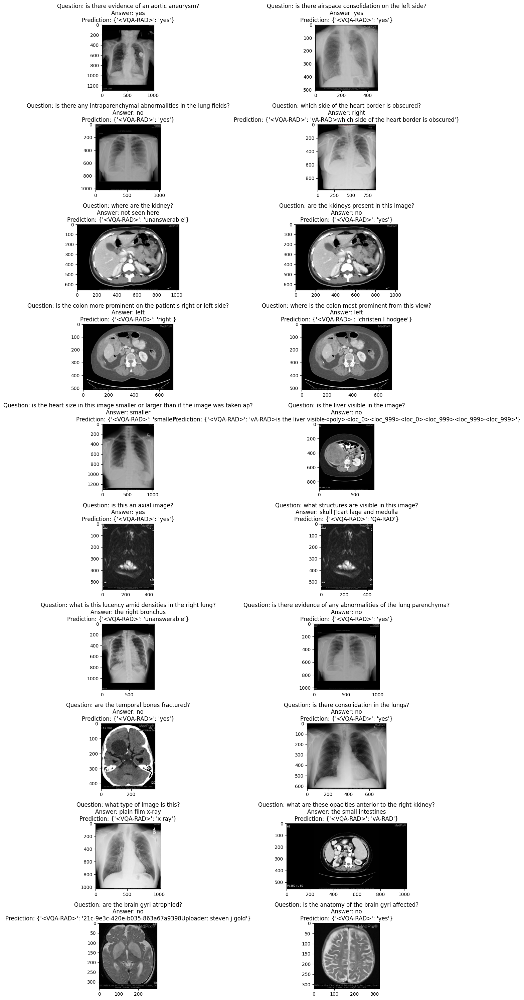

In [ ]:
plt.figure(figsize=(15, 30))

answers = []
predicted_answers = []
questions = []

for idx in range(20):
    plt.subplot(10, 2, idx+1)
    sample = data_vqarad["test"][idx]
    question, image, answer = sample["question"], sample["image"].convert("RGB"), sample["answer"]
    task_prompt = "<VQA-RAD>"
    question, answer, parsed_answer = run_example(task_prompt, text_input=question)
    plt.title(
        "Question: {}\nAnswer: {}\nPrediction: {}".format(
            question, answer, parsed_answer
        ),
        fontsize=12
    )
    plt.imshow(image)

    questions.append(question)
    answers.append(answer)
    predicted_answers.append(parsed_answer["<VQA-RAD>"])

plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
df_report = pd.DataFrame({"question": questions, "answer": answers, "predicted_answer": predicted_answers})
df_report["correct"] = df_report["answer"] == df_report["predicted_answer"]
print("Evaluation Score:", df_report["correct"].mean())
df_report

Evaluation Score: 0.2


,question,answer,predicted_answer,correct
0,is there evidence of an aortic aneurysm?,yes,yes,True
1,is there airspace consolidation on the left side?,yes,yes,True
2,is there any intraparenchymal abnormalities in...,no,yes,False
3,which side of the heart border is obscured?,right,vA-RAD>which side of the heart border is obscured,False
4,where are the kidney?,not seen here,unanswerable,False
5,are the kidneys present in this image?,no,yes,False
6,is the colon more prominent on the patient's r...,left,right,False
7,where is the colon most prominent from this view?,left,christen l hodgee,False
8,is the heart size in this image smaller or lar...,smaller,smaller,True
9,is the liver visible in the image?,no,vA-RAD>is the liver visible<poly><loc_0><loc_9...,False


#### 50 Soal Pertama

<ipython-input-15-9eb5160e191c>:25: UserWarning: Glyph 9 (	) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


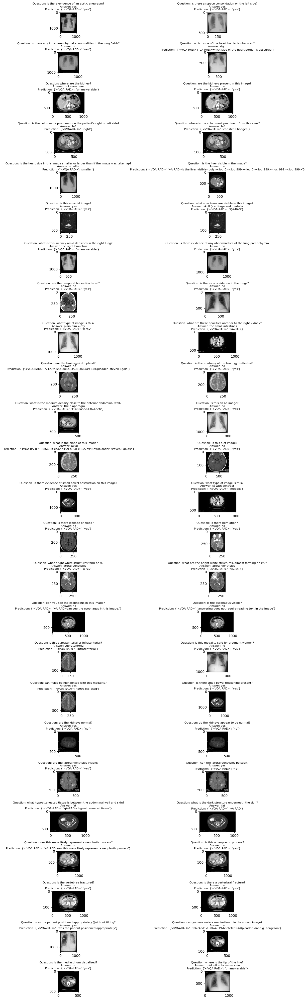

In [ ]:
plt.figure(figsize=(15, 40))

answers = []
predicted_answers = []
questions = []

for idx in range(50):
    plt.subplot(25, 2, idx+1)
    sample = data_vqarad["test"][idx]
    question, image, answer = sample["question"], sample["image"].convert("RGB"), sample["answer"]
    task_prompt = "<VQA-RAD>"
    question, answer, parsed_answer = run_example(task_prompt, text_input=question)
    plt.title(
        "Question: {}\nAnswer: {}\nPrediction: {}".format(
            question, answer, parsed_answer
        ),
        fontsize=8
    )
    plt.imshow(image)

    questions.append(question)
    answers.append(answer)
    predicted_answers.append(parsed_answer["<VQA-RAD>"])

plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
df_report = pd.DataFrame({"question": questions, "answer": answers, "predicted_answer": predicted_answers})
df_report["correct"] = df_report["answer"] == df_report["predicted_answer"]
print("Evaluation Score:", df_report["correct"].mean())
df_report

Evaluation Score: 0.14


,question,answer,predicted_answer,correct
0,is there evidence of an aortic aneurysm?,yes,yes,True
1,is there airspace consolidation on the left side?,yes,yes,True
2,is there any intraparenchymal abnormalities in...,no,yes,False
3,which side of the heart border is obscured?,right,vA-RAD>which side of the heart border is obscured,False
4,where are the kidney?,not seen here,unanswerable,False
5,are the kidneys present in this image?,no,yes,False
6,is the colon more prominent on the patient's r...,left,right,False
7,where is the colon most prominent from this view?,left,christen l hodgee,False
8,is the heart size in this image smaller or lar...,smaller,smaller,True
9,is the liver visible in the image?,no,vA-RAD>is the liver visible<poly><loc_0><loc_9...,False


### Training

In [ ]:
epochs = 5
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-6)
num_training_steps = epochs * len(train_loader)

lr_scheduler = get_scheduler(
    name="linear",
    optimizer=optimizer,
    num_warmup_steps=0,
    num_training_steps=num_training_steps,
)

for epoch in range(epochs):
    model.train()
    train_loss = 0
    i = -1
    tqdm_train_iterator = tqdm(train_loader, desc=f"Training Epoch {epoch + 1}/{epochs}")
    for iter, (inputs, answers) in enumerate(tqdm_train_iterator, 1):
        i += 1
        input_ids = inputs["input_ids"]
        pixel_values = inputs["pixel_values"]
        labels = processor.tokenizer(text=answers, return_tensors="pt", padding=True, return_token_type_ids=False).input_ids.to(device)
        outputs = model(input_ids=input_ids, pixel_values=pixel_values, labels=labels)
        loss = outputs.loss
        loss.backward()
        optimizer.step()
        lr_scheduler.step()
        optimizer.zero_grad()
        train_loss += loss.item()
        tqdm_train_iterator.set_description(f"Epoch {epoch + 1}/{epochs} | Loss: {train_loss / iter:.4f}")
    avg_train_loss = train_loss / len(train_loader)
    print(f"|-> Average Training Loss\t: {avg_train_loss}")

    model.eval()
    val_loss = 0
    with torch.no_grad():
        tqdm_val_iterator = tqdm(val_loader, desc=f"Validation Epoch {epoch + 1}/{epochs}")
        for batch in tqdm_val_iterator:
            inputs, answers = batch
            input_ids = inputs["input_ids"]
            pixel_values = inputs["pixel_values"]
            labels = processor.tokenizer(text=answers, return_tensors="pt", padding=True, return_token_type_ids=False).input_ids.to(device)
            outputs = model(input_ids=input_ids, pixel_values=pixel_values, labels=labels)
            loss = outputs.loss
            val_loss += loss.item()
            tqdm_val_iterator.set_postfix(loss=val_loss)
    print("|-> Validation Loss\t\t:", val_loss / len(val_loader))

Epoch 1/5 | Loss: 3.5524: 100%|██████████| 598/598 [19:40<00:00,  1.97s/it]


|-> Average Training Loss	: 3.55241943384991


Validation Epoch 1/5: 100%|██████████| 151/151 [01:40<00:00,  1.50it/s, loss=2.12e+3]


|->Validation Loss	: 2.002569586334639


Epoch 2/5 | Loss: 1.9676: 100%|██████████| 598/598 [19:38<00:00,  1.97s/it]


|-> Average Training Loss	: 1.9676053895051264


Validation Epoch 2/5: 100%|██████████| 151/151 [01:37<00:00,  1.54it/s, loss=1.18e+3]


|->Validation Loss	: 1.4298597322098467


Epoch 3/5 | Loss: 1.4612: 100%|██████████| 598/598 [19:20<00:00,  1.94s/it]


|-> Average Training Loss	: 1.4611543067621946


Validation Epoch 3/5: 100%|██████████| 151/151 [01:38<00:00,  1.54it/s, loss=874]


|->Validation Loss	: 1.3110594394684627


Epoch 4/5 | Loss: 1.2838: 100%|██████████| 598/598 [19:19<00:00,  1.94s/it]


|-> Average Training Loss	: 1.283779178948506


Validation Epoch 4/5: 100%|██████████| 151/151 [01:38<00:00,  1.53it/s, loss=768]


|->Validation Loss	: 1.2769056555155098


Epoch 5/5 | Loss: 1.2148: 100%|██████████| 598/598 [19:21<00:00,  1.94s/it]


|-> Average Training Loss	: 1.2147816888190632


Validation Epoch 5/5: 100%|██████████| 151/151 [01:38<00:00,  1.53it/s, loss=726]

|->Validation Loss	: 1.2649676623131265


In [ ]:
processor.save_pretrained("models/")
model.save_pretrained("models/")

In [ ]:
!zip -r models.zip models

  adding: models/ (stored 0%)
  adding: models/special_tokens_map.json (deflated 98%)
  adding: models/generation_config.json (deflated 47%)
  adding: models/merges.txt (deflated 53%)
  adding: models/config.json (deflated 76%)
  adding: models/vocab.json (deflated 59%)
  adding: models/model.safetensors (deflated 13%)
  adding: models/added_tokens.json (deflated 79%)
  adding: models/tokenizer_config.json (deflated 95%)
  adding: models/tokenizer.json (deflated 74%)
  adding: models/preprocessor_config.json (deflated 53%)


### Evaluation

In [ ]:
data_vqarad["test"]["question"][:50]

['is there evidence of an aortic aneurysm?',
 'is there airspace consolidation on the left side?',
 'is there any intraparenchymal abnormalities in the lung fields?',
 'which side of the heart border is obscured?',
 'where are the kidney?',
 'are the kidneys present in this image?',
 "is the colon more prominent on the patient's right or left side?",
 'where is the colon most prominent from this view?',
 'is the heart size in this image smaller or larger than if the image was taken ap?',
 'is the liver visible in the image?',
 'is this an axial image?',
 'what structures are visible in this image?',
 'what is this lucency amid densities in the right lung?',
 'is there evidence of any abnormalities of the lung parenchyma?',
 'are the temporal bones fractured?',
 'is there consolidation in the lungs?',
 'what type of image is this?',
 'what are these opacities anterior to the right kidney?',
 'are the brain gyri atrophied?',
 'is the anatomy of the brain gyri affected?',
 'what is the me

In [ ]:
def run_example(task_prompt, text_input=None):
    if text_input is None:
        prompt = task_prompt
    else:
        prompt = task_prompt + text_input
    inputs = processor(text=prompt, images=image, return_tensors="pt")
    generated_ids = model.generate(
        input_ids=inputs["input_ids"].cuda(),
        pixel_values=inputs["pixel_values"].cuda(),
        max_new_tokens=1024,
        early_stopping=False,
        do_sample=False,
        num_beams=3,
    )
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]
    parsed_answer = processor.post_process_generation(
        generated_text,
        task=task_prompt,
        image_size=(image.width, image.height)
    )
    return question, answer, parsed_answer

#### 20 Soal Pertama

<ipython-input-28-5c535a059aea>:25: UserWarning: Glyph 9 (	) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


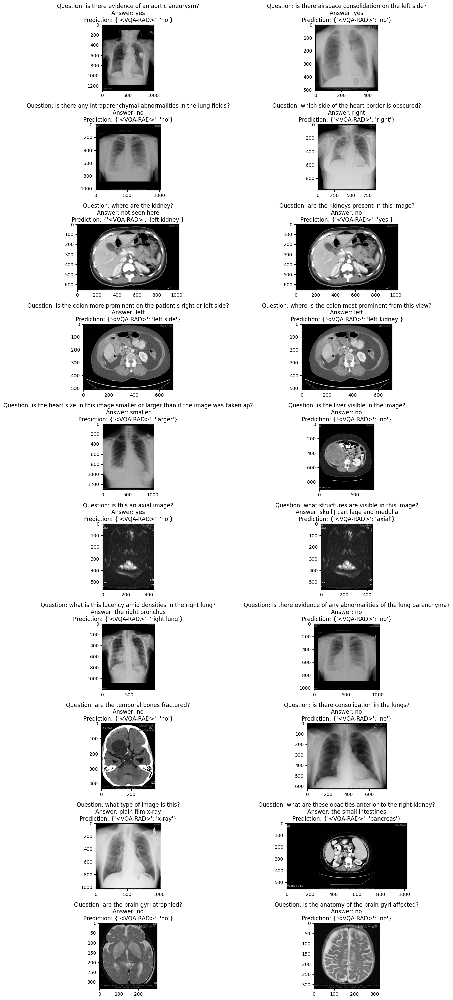

In [ ]:
plt.figure(figsize=(15, 30))

answers = []
predicted_answers = []
questions = []

for idx in range(20):
    plt.subplot(10, 2, idx+1)
    sample = data_vqarad["test"][idx]
    question, image, answer = sample["question"], sample["image"].convert("RGB"), sample["answer"]
    task_prompt = "<VQA-RAD>"
    question, answer, parsed_answer = run_example(task_prompt, text_input=question)
    plt.title(
        "Question: {}\nAnswer: {}\nPrediction: {}".format(
            question, answer, parsed_answer
        ),
        fontsize=12
    )
    plt.imshow(image)

    questions.append(question)
    answers.append(answer)
    predicted_answers.append(parsed_answer["<VQA-RAD>"])

plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
df_report = pd.DataFrame({"question": questions, "answer": answers, "predicted_answer": predicted_answers})
df_report["correct"] = df_report["answer"] == df_report["predicted_answer"]
print("Evaluation Score:", df_report["correct"].mean())
df_report

Evaluation Score: 0.4


,question,answer,predicted_answer,correct
0,is there evidence of an aortic aneurysm?,yes,no,False
1,is there airspace consolidation on the left side?,yes,no,False
2,is there any intraparenchymal abnormalities in...,no,no,True
3,which side of the heart border is obscured?,right,right,True
4,where are the kidney?,not seen here,left kidney,False
5,are the kidneys present in this image?,no,yes,False
6,is the colon more prominent on the patient's r...,left,left side,False
7,where is the colon most prominent from this view?,left,left kidney,False
8,is the heart size in this image smaller or lar...,smaller,larger,False
9,is the liver visible in the image?,no,no,True


#### 50 Soal Pertama

<ipython-input-40-9eb5160e191c>:25: UserWarning: Glyph 9 (	) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


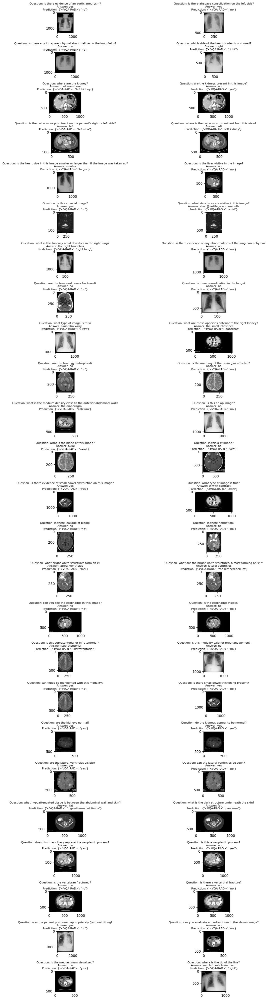

In [ ]:
plt.figure(figsize=(15, 40))

answers = []
predicted_answers = []
questions = []

for idx in range(50):
    plt.subplot(25, 2, idx+1)
    sample = data_vqarad["test"][idx]
    question, image, answer = sample["question"], sample["image"].convert("RGB"), sample["answer"]
    task_prompt = "<VQA-RAD>"
    question, answer, parsed_answer = run_example(task_prompt, text_input=question)
    plt.title(
        "Question: {}\nAnswer: {}\nPrediction: {}".format(
            question, answer, parsed_answer
        ),
        fontsize=8
    )
    plt.imshow(image)

    questions.append(question)
    answers.append(answer)
    predicted_answers.append(parsed_answer["<VQA-RAD>"])

plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
df_report = pd.DataFrame({"question": questions, "answer": answers, "predicted_answer": predicted_answers})
df_report["correct"] = df_report["answer"] == df_report["predicted_answer"]
print("Evaluation Score:", df_report["correct"].mean())
df_report

Evaluation Score: 0.44


,question,answer,predicted_answer,correct
0,is there evidence of an aortic aneurysm?,yes,no,False
1,is there airspace consolidation on the left side?,yes,no,False
2,is there any intraparenchymal abnormalities in...,no,no,True
3,which side of the heart border is obscured?,right,right,True
4,where are the kidney?,not seen here,left kidney,False
5,are the kidneys present in this image?,no,yes,False
6,is the colon more prominent on the patient's r...,left,left side,False
7,where is the colon most prominent from this view?,left,left kidney,False
8,is the heart size in this image smaller or lar...,smaller,larger,False
9,is the liver visible in the image?,no,no,True


In [ ]:
!mv models.zip /content/drive/MyDrive/Kalbe/PRICAI

## Fine-Tuning: VQA-RAD (using LoRA)

In [ ]:
data_vqarad = load_dataset("flaviagiammarino/vqa-rad")

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# bnb_config = BitsAndBytesConfig(
#     load_in_4bit=True,
#     bnb_4bit_quant_type="nf4",
#     bnb_4bit_use_double_quant = True,
#     bnb_4bit_compute_dtype = torch.float16
# )

processor = AutoProcessor.from_pretrained(
    "microsoft/Florence-2-base-ft",
    trust_remote_code=True,
    # revision='refs/pr/6'
)
model = AutoModelForCausalLM.from_pretrained(
    "microsoft/Florence-2-base-ft",
    trust_remote_code = True,
    # quantization_config = bnb_config, # error during training:
                                        # Input type (float) and bias type (c10::Half) should be the same
    # device_map = 'auto', # error
    # use_cache = False    # error
    # revision='refs/pr/6'
).to(device)

In [ ]:
from peft import LoraConfig, get_peft_model

TARGET_MODULES = [
    "q_proj", "o_proj", "k_proj", "v_proj",
    "linear", "Conv2d", "lm_head", "fc2"
]

# REVISION = 'refs/pr/6'
config = LoraConfig(
    r = 8,
    lora_alpha = 8,
    target_modules = TARGET_MODULES,
    task_type = "CAUSAL_LM",
    lora_dropout = 0.05,
    bias = "none",
    inference_mode = False,
    use_rslora = True,
    init_lora_weights = "gaussian",
    # revision = REVISION
)

model = get_peft_model(model, config)
model.print_trainable_parameters()

trainable params: 1,929,928 || all params: 272,733,896 || trainable%: 0.7076


In [ ]:
# for param in model.vision_tower.parameters():
#     param.is_trainable = False

### Prepare Dataset

In [ ]:
class VQARADDataset(Dataset):

    def __init__(self, data):
        self.data = data

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        example = self.data[idx]
        question = "<VQA-RAD>" + example['question']
        answer = example['answer']
        image = example['image'].convert("RGB")
        return question, answer, image

In [ ]:
def collate_fn(batch):
    questions, answers, images = zip(*batch)
    inputs = processor(text=list(questions), images=list(images), return_tensors="pt", padding=True).to(device)
    return inputs, answers

train_dataset = VQARADDataset(data_vqarad['train'])
val_dataset = VQARADDataset(data_vqarad['test'])
batch_size = 3
num_workers = 0

train_loader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    collate_fn=collate_fn,
    num_workers=num_workers,
    shuffle=True
)
val_loader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    collate_fn=collate_fn,
    num_workers=num_workers
)


### Evaluate Model Before Training

In [ ]:
def run_example(task_prompt, text_input=None):
    if text_input is None:
        prompt = task_prompt
    else:
        prompt = task_prompt + text_input
    inputs = processor(text=prompt, images=image, return_tensors="pt")
    generated_ids = model.generate(
        input_ids=inputs["input_ids"].cuda(),
        pixel_values=inputs["pixel_values"].cuda(),
        max_new_tokens=1024,
        early_stopping=False,
        do_sample=False,
        num_beams=3,
    )
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]
    parsed_answer = processor.post_process_generation(
        generated_text,
        task=task_prompt,
        image_size=(image.width, image.height)
    )
    return question, answer, parsed_answer

<ipython-input-21-e46316f4b61a>:25: UserWarning: Glyph 9 (	) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


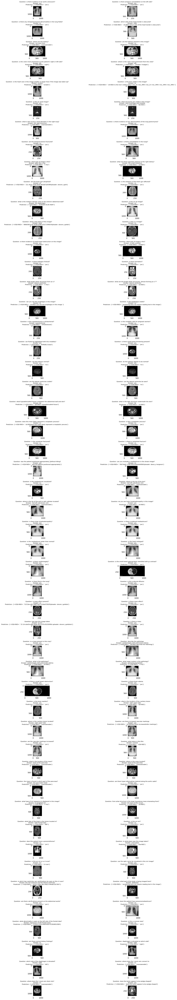

In [ ]:
plt.figure(figsize=(20, 80))

answers = []
predicted_answers = []
questions = []

for idx in range(100):
    plt.subplot(50, 2, idx+1)
    sample = data_vqarad["test"][idx]
    question, image, answer = sample["question"], sample["image"].convert("RGB"), sample["answer"]
    task_prompt = "<VQA-RAD>"
    question, answer, parsed_answer = run_example(task_prompt, text_input=question)
    plt.title(
        "Question: {}\nAnswer: {}\nPrediction: {}".format(
            question, answer, parsed_answer
        ),
        fontsize=8
    )
    plt.imshow(image)

    questions.append(question)
    answers.append(answer)
    predicted_answers.append(parsed_answer["<VQA-RAD>"])

plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
df_report = pd.DataFrame({"question": questions, "answer": answers, "predicted_answer": predicted_answers})
df_report["correct"] = df_report["answer"] == df_report["predicted_answer"]
print("Evaluation Score:", df_report["correct"].mean())
df_report

Evaluation Score: 0.25


,question,answer,predicted_answer,correct
0,is there evidence of an aortic aneurysm?,yes,yes,True
1,is there airspace consolidation on the left side?,yes,yes,True
2,is there any intraparenchymal abnormalities in...,no,yes,False
3,which side of the heart border is obscured?,right,vA-RAD>which side of the heart border is obscured,False
4,where are the kidney?,not seen here,unanswerable,False
...,...,...,...,...
95,diaphragm is elevated on which side?,right,right,True
96,which side of the diaphragm is elevated?,right,left,False
97,where does the l renal vein connect to,ivc,unanswerable,False
98,where does the l renal vein drain into?,ivc,unanswerable,False


### Training

In [ ]:
epochs = 6
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-6)
num_training_steps = epochs * len(train_loader)

lr_scheduler = get_scheduler(
    name="linear",
    optimizer=optimizer,
    num_warmup_steps=0,
    num_training_steps=num_training_steps,
)

for epoch in range(epochs):
    model.train()
    train_loss = 0
    i = -1
    tqdm_train_iterator = tqdm(train_loader, desc=f"Training Epoch {epoch + 1}/{epochs}")
    for iter, (inputs, answers) in enumerate(tqdm_train_iterator, 1):
        i += 1
        input_ids = inputs["input_ids"]
        pixel_values = inputs["pixel_values"]
        labels = processor.tokenizer(
            text=answers, return_tensors="pt", padding=True, return_token_type_ids=False
        ).input_ids.to(device)
        outputs = model(input_ids=input_ids, pixel_values=pixel_values, labels=labels)
        loss = outputs.loss
        loss.backward()
        optimizer.step()
        lr_scheduler.step()
        optimizer.zero_grad()
        train_loss += loss.item()
        tqdm_train_iterator.set_description(f"Epoch {epoch + 1}/{epochs} | Loss: {train_loss / iter:.4f}")
    avg_train_loss = train_loss / len(train_loader)
    print(f"|-> Average Training Loss\t: {avg_train_loss}")

    model.eval()
    val_loss = 0
    with torch.no_grad():
        tqdm_val_iterator = tqdm(val_loader, desc=f"Validation Epoch {epoch + 1}/{epochs}")
        for batch in tqdm_val_iterator:
            inputs, answers = batch
            input_ids = inputs["input_ids"]
            pixel_values = inputs["pixel_values"]
            labels = processor.tokenizer(text=answers, return_tensors="pt", padding=True, return_token_type_ids=False).input_ids.to(device)
            outputs = model(input_ids=input_ids, pixel_values=pixel_values, labels=labels)
            loss = outputs.loss
            val_loss += loss.item()
            tqdm_val_iterator.set_postfix(loss=val_loss)
    print("|-> Validation Loss\t\t:", val_loss / len(val_loader))

Epoch 1/6 | Loss: 5.6285: 100%|██████████| 598/598 [13:05<00:00,  1.31s/it]


|-> Average Training Loss	: 5.628517091461149


Validation Epoch 1/6: 100%|██████████| 151/151 [01:36<00:00,  1.56it/s, loss=653]


|-> Validation Loss		: 4.3243752107122875


Epoch 2/6 | Loss: 4.9750: 100%|██████████| 598/598 [12:55<00:00,  1.30s/it]


|-> Average Training Loss	: 4.974959332433632


Validation Epoch 2/6: 100%|██████████| 151/151 [01:37<00:00,  1.55it/s, loss=595]


|-> Validation Loss		: 3.941395309192455


Epoch 3/6 | Loss: 4.5760: 100%|██████████| 598/598 [12:52<00:00,  1.29s/it]


|-> Average Training Loss	: 4.576011335495922


Validation Epoch 3/6: 100%|██████████| 151/151 [01:37<00:00,  1.55it/s, loss=542]


|-> Validation Loss		: 3.5891179078264743


Epoch 4/6 | Loss: 4.2049: 100%|██████████| 598/598 [12:52<00:00,  1.29s/it]


|-> Average Training Loss	: 4.204948787455973


Validation Epoch 4/6: 100%|██████████| 151/151 [01:36<00:00,  1.56it/s, loss=491]


|-> Validation Loss		: 3.2543588294986856


Epoch 5/6 | Loss: 3.8416: 100%|██████████| 598/598 [12:52<00:00,  1.29s/it]


|-> Average Training Loss	: 3.8416436760371746


Validation Epoch 5/6: 100%|██████████| 151/151 [01:36<00:00,  1.56it/s, loss=456]


|-> Validation Loss		: 3.019803060650431


Epoch 6/6 | Loss: 3.6870: 100%|██████████| 598/598 [12:52<00:00,  1.29s/it]


|-> Average Training Loss	: 3.6869516228528125


Validation Epoch 6/6: 100%|██████████| 151/151 [01:36<00:00,  1.56it/s, loss=444]

|-> Validation Loss		: 2.9392623214532207


In [ ]:
processor.save_pretrained("models/")
model.save_pretrained("models/")

/usr/local/lib/python3.10/dist-packages/peft/utils/save_and_load.py:180: UserWarning: Setting `save_embedding_layers` to `True` as embedding layers found in `target_modules`.
  warnings.warn("Setting `save_embedding_layers` to `True` as embedding layers found in `target_modules`.")


In [ ]:
!zip -r models-florence-2-lora.zip models

  adding: models/ (stored 0%)
  adding: models/special_tokens_map.json (deflated 98%)
  adding: models/adapter_model.safetensors (deflated 7%)
  adding: models/vocab.json (deflated 59%)
  adding: models/preprocessor_config.json (deflated 53%)
  adding: models/added_tokens.json (deflated 79%)
  adding: models/tokenizer_config.json (deflated 95%)
  adding: models/adapter_config.json (deflated 52%)
  adding: models/tokenizer.json (deflated 74%)
  adding: models/README.md (deflated 66%)
  adding: models/merges.txt (deflated 53%)


In [ ]:
!mv models-florence-2-lora.zip /content/drive/MyDrive/Kalbe/PRICAI

### Evaluation

In [ ]:
def run_example(task_prompt, text_input=None):
    if text_input is None:
        prompt = task_prompt
    else:
        prompt = task_prompt + text_input
    inputs = processor(text=prompt, images=image, return_tensors="pt")
    generated_ids = model.generate(
        input_ids=inputs["input_ids"].cuda(),
        pixel_values=inputs["pixel_values"].cuda(),
        max_new_tokens=1024,
        early_stopping=False,
        do_sample=False,
        num_beams=3,
    )
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]
    parsed_answer = processor.post_process_generation(
        generated_text,
        task=task_prompt,
        image_size=(image.width, image.height)
    )
    return question, answer, parsed_answer

<ipython-input-17-e46316f4b61a>:25: UserWarning: Glyph 9 (	) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


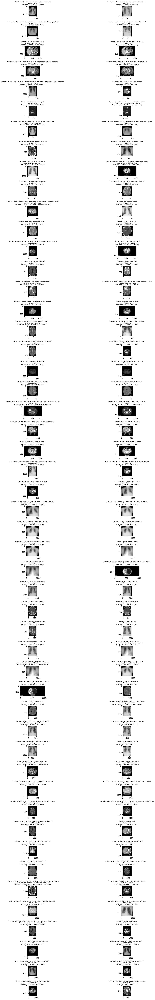

In [ ]:
plt.figure(figsize=(20, 80))

answers = []
predicted_answers = []
questions = []

for idx in range(100):
    plt.subplot(50, 2, idx+1)
    sample = data_vqarad["test"][idx]
    question, image, answer = sample["question"], sample["image"].convert("RGB"), sample["answer"]
    task_prompt = "<VQA-RAD>"
    question, answer, parsed_answer = run_example(task_prompt, text_input=question)
    plt.title(
        "Question: {}\nAnswer: {}\nPrediction: {}".format(
            question, answer, parsed_answer
        ),
        fontsize=8
    )
    plt.imshow(image)

    questions.append(question)
    answers.append(answer)
    predicted_answers.append(parsed_answer["<VQA-RAD>"])

plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
df_report = pd.DataFrame({"question": questions, "answer": answers, "predicted_answer": predicted_answers})
df_report["correct"] = df_report["answer"] == df_report["predicted_answer"]
print("Evaluation Score:", df_report["correct"].mean())
df_report

Evaluation Score: 0.33


,question,answer,predicted_answer,correct
0,is there evidence of an aortic aneurysm?,yes,yes,True
1,is there airspace consolidation on the left side?,yes,yes,True
2,is there any intraparenchymal abnormalities in...,no,no,True
3,which side of the heart border is obscured?,right,right,True
4,where are the kidney?,not seen here,right,False
...,...,...,...,...
95,diaphragm is elevated on which side?,right,right,True
96,which side of the diaphragm is elevated?,right,right,True
97,where does the l renal vein connect to,ivc,right,False
98,where does the l renal vein drain into?,ivc,right,False


In [ ]:
!mv models.zip /content/drive/MyDrive/Kalbe/PRICAI

mv: cannot stat 'models.zip': No such file or directory


## Fine-tuning: Path VQA [Not Done]

In [ ]:
from datasets import load_dataset

from PIL import Image
import numpy as np

In [ ]:
path_vqa = load_dataset("flaviagiammarino/path-vqa")

Generating train split:   0%|          | 0/19654 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/6259 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/6719 [00:00<?, ? examples/s]

In [ ]:
path_vqa

DatasetDict({
    train: Dataset({
        features: ['image', 'question', 'answer'],
        num_rows: 19654
    })
    validation: Dataset({
        features: ['image', 'question', 'answer'],
        num_rows: 6259
    })
    test: Dataset({
        features: ['image', 'question', 'answer'],
        num_rows: 6719
    })
})

In [ ]:
path_vqa["train"]["question"][:50]

['where are liver stem cells (oval cells) located?',
 'what are stained here with an immunohistochemical stain for cytokeratin 7?',
 'what do the areas of white chalky deposits represent?',
 'is embolus derived from a lower-extremity deep venous thrombus lodged in a pulmonary artery branch?',
 'how is hyperplasia without atypia characterized?',
 'is normal palmar creases present?',
 'where is this from?',
 'what is present?',
 'what is present?',
 'what is present?',
 'what does this image show?',
 'does this image show excellent photo typical adenocarcinoma extending through muscularis to serosa?',
 'does typical tuberculous exudate show excellent photo typical adenocarcinoma extending through muscularis to serosa?',
 'what is present?',
 'is gastrointestinal present?',
 'is hyperplasia without atypia characterized by nests of closely packed glands?',
 'is mucoepidermoid carcinoma present?',
 'what is present?',
 'is colon present?',
 'is edema present?',
 'where is this from?',
 'wha

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = AutoModelForCausalLM.from_pretrained(
    "microsoft/Florence-2-base-ft",
    trust_remote_code=True,
    revision='refs/pr/6'
).to(device)
processor = AutoProcessor.from_pretrained(
    "microsoft/Florence-2-base-ft",
    trust_remote_code=True, revision='refs/pr/6'
)

for param in model.vision_tower.parameters():
    param.is_trainable = False

In [ ]:
def detailed_parameter_count(model, _print=False):
    total_params = 0
    total_trainable_params = 0
    for name, param in model.named_parameters():
        param_count = param.numel()
        total_params += param_count
        if param.requires_grad:
            if _print:
                print(f"{name}: {param_count} parameters")
            total_trainable_params += param_count
    return total_params, total_trainable_params

total_params, total_trainable_params = detailed_parameter_count(model)
print(f"Total number of parameters           : {total_params}")
print(f"Total number of trainable parameters : {total_trainable_params}")

### Prepare Dataset

In [ ]:
class VQAPathDataset(Dataset):

    def __init__(self, data):
        self.data = data

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        example = self.data[idx]
        question = "<VQA-Path>" + example['question']
        answer = example['answer']
        image = example['image'].convert("RGB")
        return question, answer, image

In [ ]:
def collate_fn(batch):
    questions, answers, images = zip(*batch)
    inputs = processor(text=list(questions), images=list(images), return_tensors="pt", padding=True).to(device)
    return inputs, answers

train_dataset = VQAPathDataset(path_vqa['train'])
val_dataset = VQAPathDataset(path_vqa['test'])
batch_size = 3
num_workers = 0

train_loader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    collate_fn=collate_fn,
    num_workers=num_workers,
    shuffle=True
)
val_loader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    collate_fn=collate_fn,
    num_workers=num_workers
)


### Evaluate Model Before Training

In [ ]:
def run_example(task_prompt, text_input=None):
    if text_input is None:
        prompt = task_prompt
    else:
        prompt = task_prompt + text_input
    inputs = processor(text=prompt, images=image, return_tensors="pt")
    generated_ids = model.generate(
        input_ids=inputs["input_ids"].cuda(),
        pixel_values=inputs["pixel_values"].cuda(),
        max_new_tokens=1024,
        early_stopping=False,
        do_sample=False,
        num_beams=3,
    )
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]
    parsed_answer = processor.post_process_generation(
        generated_text,
        task=task_prompt,
        image_size=(image.width, image.height)
    )
    return question, answer, parsed_answer

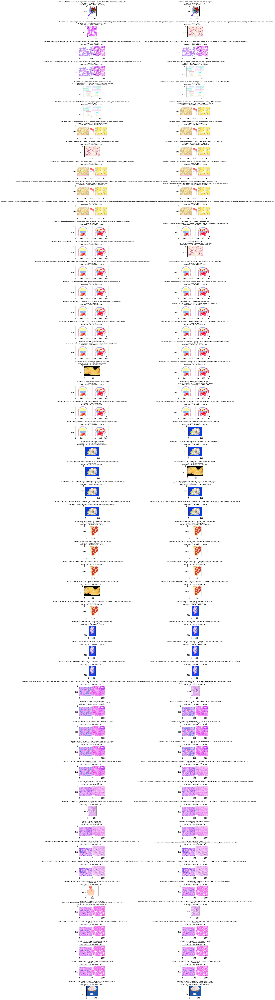

In [ ]:
plt.figure(figsize=(20, 80))

answers = []
predicted_answers = []
questions = []

for idx in range(100):
    plt.subplot(50, 2, idx+1)
    sample = path_vqa["test"][idx]
    question, image, answer = sample["question"], sample["image"].convert("RGB"), sample["answer"]
    task_prompt = "<VQA-Path>"
    question, answer, parsed_answer = run_example(task_prompt, text_input=question)
    plt.title(
        "Question: {}\nAnswer: {}\nPrediction: {}".format(
            question, answer, parsed_answer
        ),
        fontsize=8
    )
    plt.imshow(image)

    questions.append(question)
    answers.append(answer)
    predicted_answers.append(parsed_answer["<VQA-Path>"])

plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
df_report = pd.DataFrame({"question": questions, "answer": answers, "predicted_answer": predicted_answers})
df_report["correct"] = df_report["answer"] == df_report["predicted_answer"]
print("Evaluation Score:", df_report["correct"].mean())
df_report

Evaluation Score: 0.24


,question,answer,predicted_answer,correct
0,"what are positively charged, thus allowing the...",the histone subunits,vitamin,False
1,how are the histone subunits charged?,positively charged,no,False
2,what is showing increased eosinophilia of cyto...,early (reversible) ischemic injury,yes,False
3,does mycobacterium avium infection in a duoden...,yes,no,False
4,what shows branching papillae having flbrovasc...,microscopy,yes,False
...,...,...,...,...
95,what do some of the whorls contain?,psammoma bodies,no,False
96,do some of the whorls contain psammoma bodies?,yes,yes,True
97,do a gaucher cell in bone marrow contain psamm...,no,no,True
98,what shows a separate encapsulated gelatinous ...,lower part of the image,yes,False


### Training

In [ ]:
epochs = 3
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-6)
num_training_steps = epochs * len(train_loader)

lr_scheduler = get_scheduler(
    name="linear",
    optimizer=optimizer,
    num_warmup_steps=0,
    num_training_steps=num_training_steps,
)

for epoch in range(epochs):
    model.train()
    train_loss = 0
    i = -1
    tqdm_train_iterator = tqdm(train_loader, desc=f"Training Epoch {epoch + 1}/{epochs}")
    for iter, (inputs, answers) in enumerate(tqdm_train_iterator, 1):
        i += 1
        input_ids = inputs["input_ids"]
        pixel_values = inputs["pixel_values"]
        labels = processor.tokenizer(
            text=answers, return_tensors="pt", padding=True, return_token_type_ids=False
        ).input_ids.to(device)
        outputs = model(input_ids=input_ids, pixel_values=pixel_values, labels=labels)
        loss = outputs.loss
        loss.backward()
        optimizer.step()
        lr_scheduler.step()
        optimizer.zero_grad()
        train_loss += loss.item()
        tqdm_train_iterator.set_description(f"Epoch {epoch + 1}/{epochs} | Loss: {train_loss / iter:.4f}")
    avg_train_loss = train_loss / len(train_loader)
    print(f"|-> Average Training Loss\t: {avg_train_loss}")

    model.eval()
    val_loss = 0
    with torch.no_grad():
        tqdm_val_iterator = tqdm(val_loader, desc=f"Validation Epoch {epoch + 1}/{epochs}")
        for batch in tqdm_val_iterator:
            inputs, answers = batch
            input_ids = inputs["input_ids"]
            pixel_values = inputs["pixel_values"]
            labels = processor.tokenizer(text=answers, return_tensors="pt", padding=True, return_token_type_ids=False).input_ids.to(device)
            outputs = model(input_ids=input_ids, pixel_values=pixel_values, labels=labels)
            loss = outputs.loss
            val_loss += loss.item()
            tqdm_val_iterator.set_postfix(loss=val_loss)
    print("|-> Validation Loss\t\t:", val_loss / len(val_loader))

Epoch 1/3 | Loss: 5.0611:   0%|          | 29/6552 [00:43<2:42:38,  1.50s/it]


KeyboardInterrupt: 

In [ ]:
processor.save_pretrained("models-vqa/")
model.save_pretrained("models-vqa/")
!zip -r vqa-rad-path-florence-2-base-lora.zip models
!mv vqa-rad-path-florence-2-base-lora.zip /content/drive/MyDrive/Kalbe/PRICAI

### Evaluation

In [ ]:
plt.figure(figsize=(20, 80))

answers = []
predicted_answers = []
questions = []

for idx in range(100):
    plt.subplot(50, 2, idx+1)
    sample = path_vqa["test"][idx]
    question, image, answer = sample["question"], sample["image"].convert("RGB"), sample["answer"]
    task_prompt = "<VQA-Path>"
    question, answer, parsed_answer = run_example(task_prompt, text_input=question)
    plt.title(
        "Question: {}\nAnswer: {}\nPrediction: {}".format(
            question, answer, parsed_answer
        ),
        fontsize=8
    )
    plt.imshow(image)

    questions.append(question)
    answers.append(answer)
    predicted_answers.append(parsed_answer["<VQA-Path>"])

plt.tight_layout()
plt.show()

## Referensi

- https://www.labellerr.com/blog/florence-2-vision-model-by-microsoft/
- https://huggingface.co/microsoft/Florence-2-large/blob/main/sample_inference.ipynb
- https://blog.roboflow.com/fine-tune-florence-2-object-detection/